In [230]:
#Import all necessary modules
import pandas as pd  ###Software library written for the Python programming language for data manipulation and analysis.
import numpy as np ### fundamental package for scientific computing with Python
import os ### using operating system dependent functionality
import scipy.stats as stats
import matplotlib.pyplot as plt 
plt.rc("font", size=14)
import seaborn as sns
%matplotlib inline
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler

In [153]:
# reading the CSV file into pandas datafr
df = pd.read_excel("D:\DATA SCIENCE {G L}\Predective modelling\compactiv.xlsx")  

In [154]:
df.head().T

,0,1,2,3,4
lread,1,0,15,0,5
lwrite,0,0,3,0,1
scall,2147,170,2162,160,330
sread,79,18,159,12,39
swrite,68,21,119,16,38
fork,0.2,0.2,2.0,0.2,0.4
exec,0.2,0.2,2.4,0.2,0.4
rchar,40671.0,448.0,NaN,NaN,NaN
wchar,53995.0,8385.0,31950.0,8670.0,12185.0
pgout,0.0,0.0,0.0,0.0,0.0


In [155]:
df.shape

(8192, 22)

In [156]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8192 entries, 0 to 8191
Data columns (total 22 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   lread     8192 non-null   int64  
 1   lwrite    8192 non-null   int64  
 2   scall     8192 non-null   int64  
 3   sread     8192 non-null   int64  
 4   swrite    8192 non-null   int64  
 5   fork      8192 non-null   float64
 6   exec      8192 non-null   float64
 7   rchar     8088 non-null   float64
 8   wchar     8177 non-null   float64
 9   pgout     8192 non-null   float64
 10  ppgout    8192 non-null   float64
 11  pgfree    8192 non-null   float64
 12  pgscan    8192 non-null   float64
 13  atch      8192 non-null   float64
 14  pgin      8192 non-null   float64
 15  ppgin     8192 non-null   float64
 16  pflt      8192 non-null   float64
 17  vflt      8192 non-null   float64
 18  runqsz    8192 non-null   object 
 19  freemem   8192 non-null   int64  
 20  freeswap  8192 non-null   int6

In [157]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [158]:
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df.shape)

Number of duplicate rows = 0
(8192, 22)


In [159]:
for column in df.columns:
    if df[column].dtype == 'object':
        print(column.upper(),': ',df[column].nunique())
        print(df[column].value_counts().sort_values())
        print('\n')

RUNQSZ :  2
CPU_Bound        3861
Not_CPU_Bound    4331
Name: runqsz, dtype: int64




In [160]:
from pylab import rcParams
rcParams['figure.figsize'] = 15,8

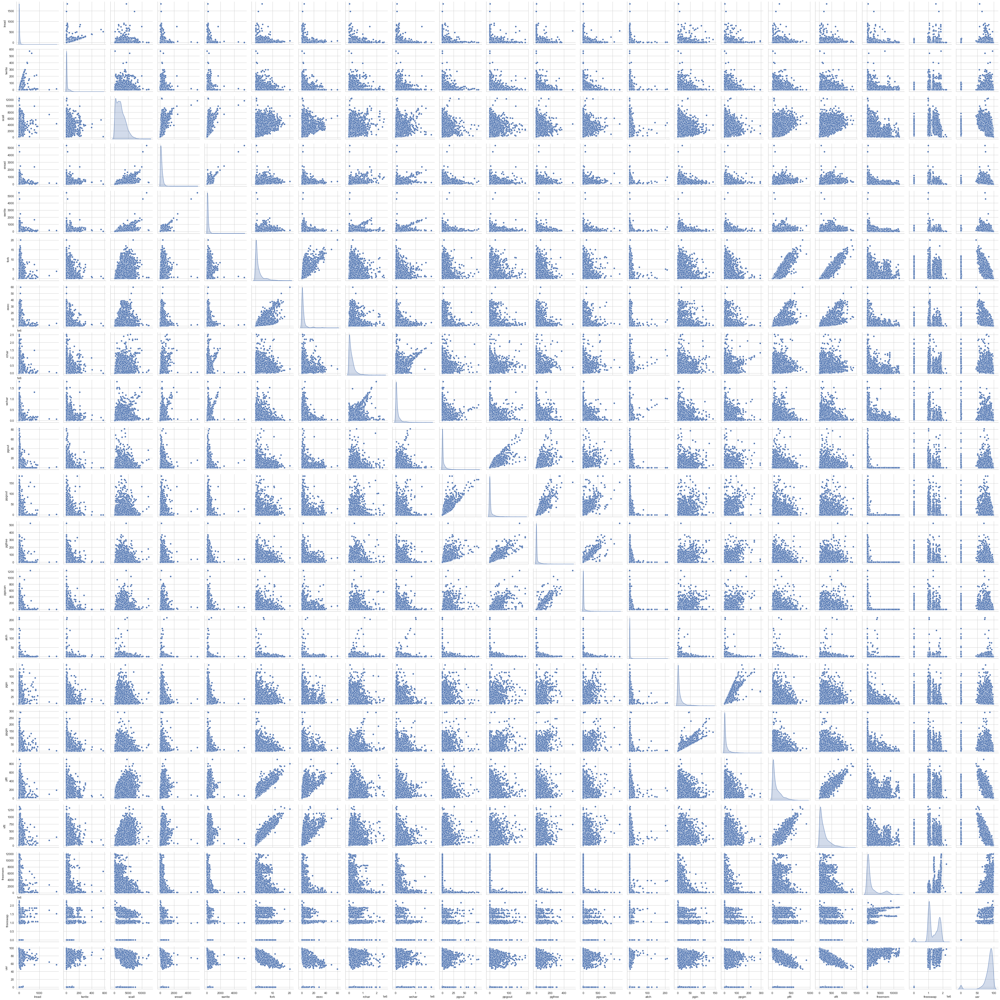

In [161]:
# Let us do a correlation analysis among the different dimensions and also each dimension with the dependent dimension
# This is done using scatter matrix function which creates a dashboard reflecting useful information about the dimensions
# The result can be stored as a .png file and opened in say, paint to get a larger view 

df_attr = df.iloc[:, 0:22]

#axes = pd.plotting.scatter_matrix(mpg_df_attr)
#plt.tight_layout()
#plt.savefig('d:\greatlakes\mpg_pairpanel.png')

sns.pairplot(df_attr, diag_kind='kde')   # to plot density curve instead of histogram

#sns.pairplot(mpg_df_attr)  # to plot histogram, the default

In [162]:
# Convert categorical variable into dummy/indicator variables. As many columns will be created as distinct values
# This is also kown as one hot coding. The column names will be America, Europe and Asia... with one hot coding
df1 = pd.get_dummies(df, columns=['runqsz'])

In [163]:
df1.head()

,lread,lwrite,scall,sread,swrite,fork,exec,rchar,wchar,pgout,...,atch,pgin,ppgin,pflt,vflt,freemem,freeswap,usr,runqsz_CPU_Bound,runqsz_Not_CPU_Bound
0,1,0,2147,79,68,0.2,0.2,40671.0,53995.0,0.0,...,0.0,1.6,2.6,16.00,26.40,4670,1730946,95,1,0
1,0,0,170,18,21,0.2,0.2,448.0,8385.0,0.0,...,0.0,0.0,0.0,15.63,16.83,7278,1869002,97,0,1
2,15,3,2162,159,119,2.0,2.4,NaN,31950.0,0.0,...,1.2,6.0,9.4,150.20,220.20,702,1021237,87,0,1
3,0,0,160,12,16,0.2,0.2,NaN,8670.0,0.0,...,0.0,0.2,0.2,15.60,16.80,7248,1863704,98,0,1
4,5,1,330,39,38,0.4,0.4,NaN,12185.0,0.0,...,0.0,1.0,1.2,37.80,47.60,633,1760253,90,0,1


In [164]:
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
lread,8192.0,1.955969e+01,53.353799,0.0,2.0,7.0,20.000,1845.00
lwrite,8192.0,1.310620e+01,29.891726,0.0,0.0,1.0,10.000,575.00
scall,8192.0,2.306318e+03,1633.617322,109.0,1012.0,2051.5,3317.250,12493.00
sread,8192.0,2.104800e+02,198.980146,6.0,86.0,166.0,279.000,5318.00
swrite,8192.0,1.500582e+02,160.478980,7.0,63.0,117.0,185.000,5456.00
fork,8192.0,1.884554e+00,2.479493,0.0,0.4,0.8,2.200,20.12
exec,8192.0,2.791998e+00,5.212456,0.0,0.2,1.2,2.800,59.56
rchar,8088.0,1.973857e+05,239837.493526,278.0,34091.5,125473.5,267828.750,2526649.00
wchar,8177.0,9.590299e+04,140841.707911,1498.0,22916.0,46619.0,106101.000,1801623.00
pgout,8192.0,2.285317e+00,5.307038,0.0,0.0,0.0,2.400,81.44


In [165]:
df1.isnull().sum()

lread                     0
lwrite                    0
scall                     0
sread                     0
swrite                    0
fork                      0
exec                      0
rchar                   104
wchar                    15
pgout                     0
ppgout                    0
pgfree                    0
pgscan                    0
atch                      0
pgin                      0
ppgin                     0
pflt                      0
vflt                      0
freemem                   0
freeswap                  0
usr                       0
runqsz_CPU_Bound          0
runqsz_Not_CPU_Bound      0
dtype: int64

In [166]:
#There are various ways to handle missing values. Drop the rows, replace missing values with median values etc. 

In [167]:
#instead of dropping the rows, lets replace the missing values with median value. 
df1.median()

lread                         7.0
lwrite                        1.0
scall                      2051.5
sread                       166.0
swrite                      117.0
fork                          0.8
exec                          1.2
rchar                    125473.5
wchar                     46619.0
pgout                         0.0
ppgout                        0.0
pgfree                        0.0
pgscan                        0.0
atch                          0.0
pgin                          2.8
ppgin                         3.8
pflt                         63.8
vflt                        120.4
freemem                     579.0
freeswap                1289289.5
usr                          89.0
runqsz_CPU_Bound              0.0
runqsz_Not_CPU_Bound          1.0
dtype: float64

In [168]:


df1 = df1.apply(lambda x: x.fillna(x.median()),axis=0)

In [169]:
df.dtypes

lread         int64
lwrite        int64
scall         int64
sread         int64
swrite        int64
fork        float64
exec        float64
rchar       float64
wchar       float64
pgout       float64
ppgout      float64
pgfree      float64
pgscan      float64
atch        float64
pgin        float64
ppgin       float64
pflt        float64
vflt        float64
runqsz       object
freemem       int64
freeswap      int64
usr           int64
dtype: object

In [172]:
df1.isnull().sum()

lread                   0
lwrite                  0
scall                   0
sread                   0
swrite                  0
fork                    0
exec                    0
rchar                   0
wchar                   0
pgout                   0
ppgout                  0
pgfree                  0
pgscan                  0
atch                    0
pgin                    0
ppgin                   0
pflt                    0
vflt                    0
freemem                 0
freeswap                0
usr                     0
runqsz_CPU_Bound        0
runqsz_Not_CPU_Bound    0
dtype: int64

In [173]:
# Are there any duplicates ?
dups = df.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
#df[dups]

Number of duplicate rows = 0


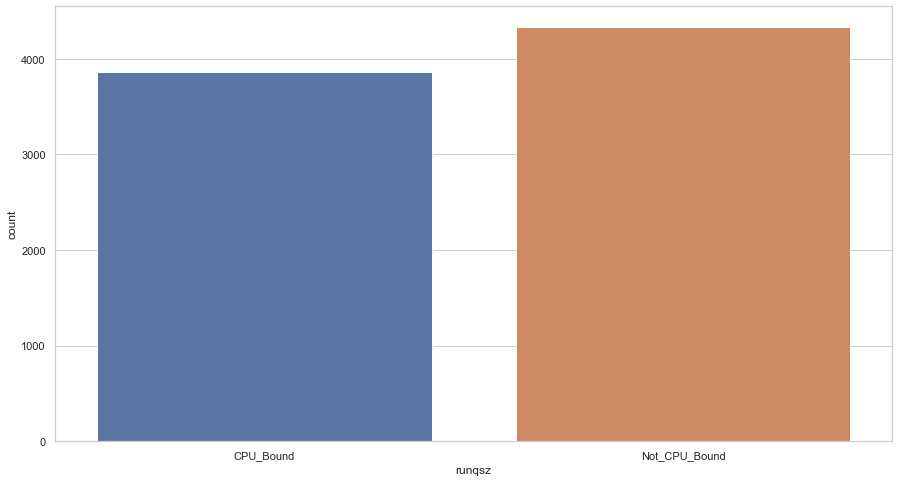

In [174]:
#univariate analysis
# count of observations for each day based on time
# set 'time' as hue parameter
sns.countplot(data = df, x = 'runqsz')

# display the plot
plt.show()

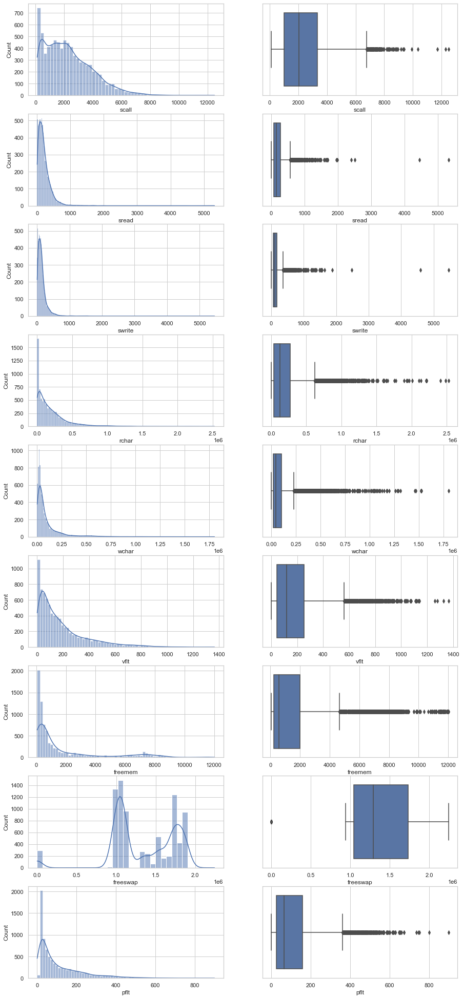

In [127]:
fig, axes = plt.subplots(nrows=9,ncols=2)
fig.set_size_inches(15,35)
sns.histplot(df['scall'], kde=True, ax=axes[0][0])
sns.boxplot(x='scall', data=df, ax=axes[0][1])
sns.histplot(df['sread'] , kde=True, ax=axes[1][0])
sns.boxplot(x='sread', data=df , ax=axes[1][1])
sns.histplot(df['swrite'] , kde=True, ax=axes[2][0])
sns.boxplot(x='swrite', data=df , ax=axes[2][1])
sns.histplot(df['rchar'] , kde=True, ax=axes[3][0])
sns.boxplot(x='rchar', data=df , ax=axes[3][1])
sns.histplot(df['wchar'] , kde=True, ax=axes[4][0])
sns.boxplot(x='wchar', data=df , ax=axes[4][1])
sns.histplot(df['vflt'] , kde=True, ax=axes[5][0])
sns.boxplot(x='vflt', data=df , ax=axes[5][1])
sns.histplot(df['freemem'] , kde=True, ax=axes[6][0])
sns.boxplot(x='freemem', data=df , ax=axes[6][1])
sns.histplot(df['freeswap'] , kde=True, ax=axes[7][0])
sns.boxplot(x='freeswap', data=df , ax=axes[7][1])
sns.histplot(df['pflt'] , kde=True, ax=axes[8][0])
sns.boxplot(x='pflt', data=df , ax=axes[8][1])
plt.show()


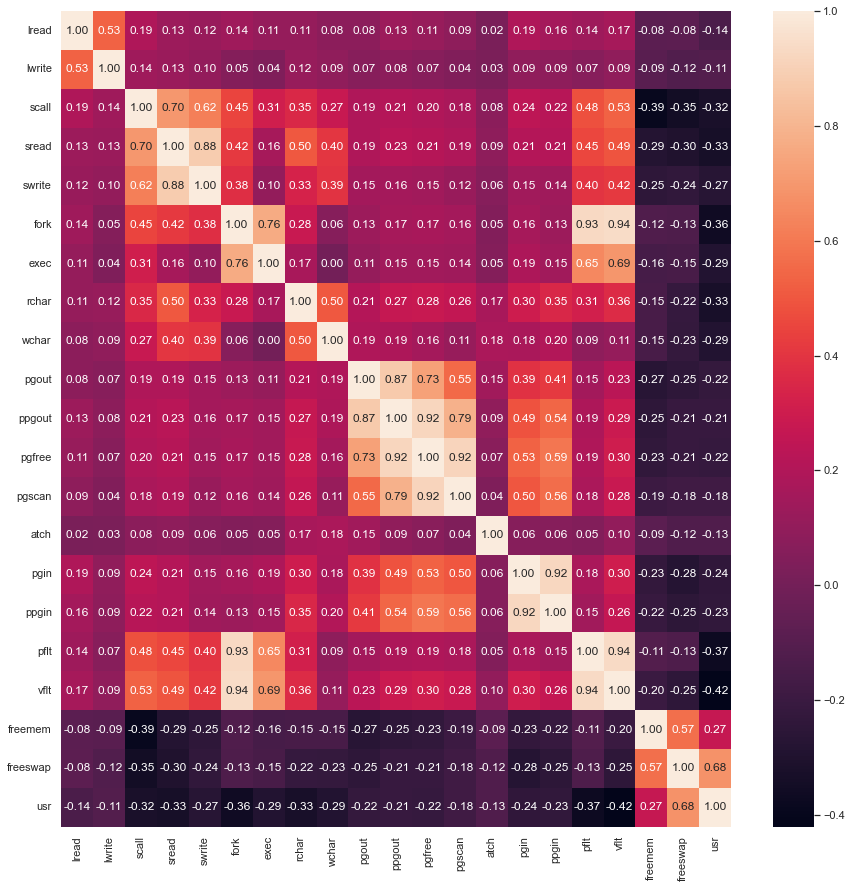

In [175]:
#Bivariate analysis
plt.figure(figsize=(15,15))
sns.heatmap(df.corr(),annot=True,fmt=".2f");

In [176]:
#outlier check

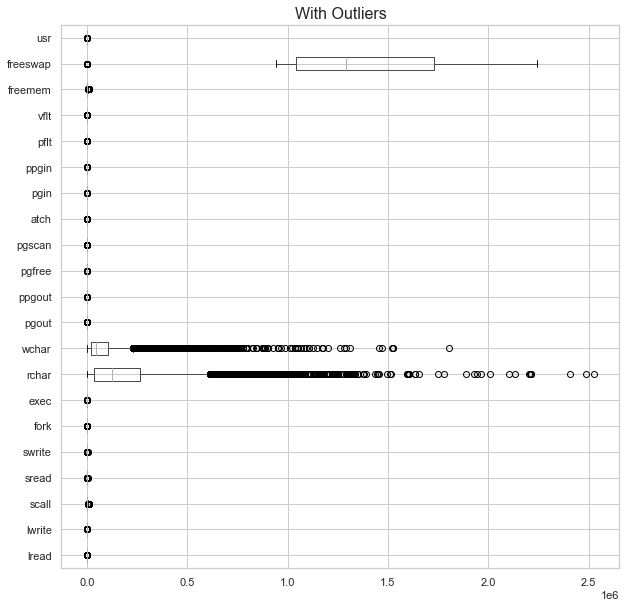

In [177]:
# construct box plot for continuous variables
cont=df1.dtypes[(df1.dtypes!='uint8') & (df1.dtypes!='bool')].index
plt.figure(figsize=(10,10))
df1[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [178]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [179]:
for column in df1[cont].columns:
    lr,ur=remove_outlier(df1[column])
    df1[column]=np.where(df1[column]>ur,ur,df1[column])
    df1[column]=np.where(df1[column]<lr,lr,df1[column])

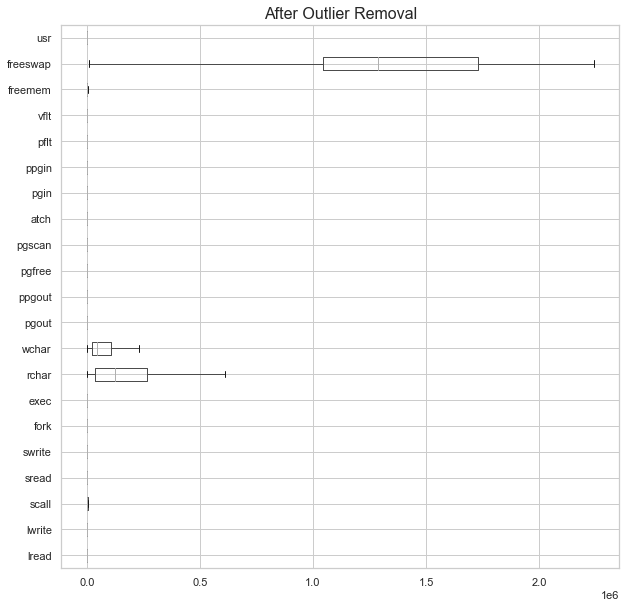

In [180]:
plt.figure(figsize=(10,10))
df1[cont].boxplot(vert=0)
plt.title('After Outlier Removal',fontsize=16)
plt.show()

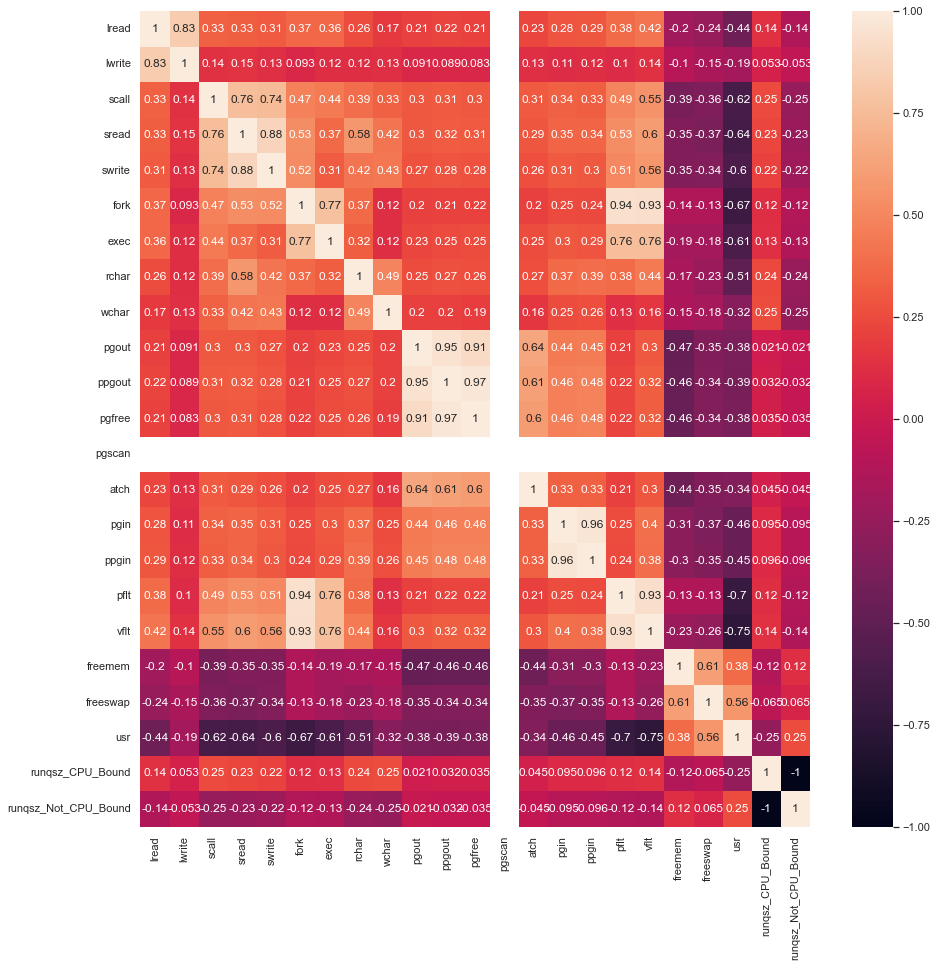

In [181]:
plt.figure(figsize=(15,15))
sns.heatmap(df1.iloc[:, 0:23].corr(),annot=True)
plt.show()

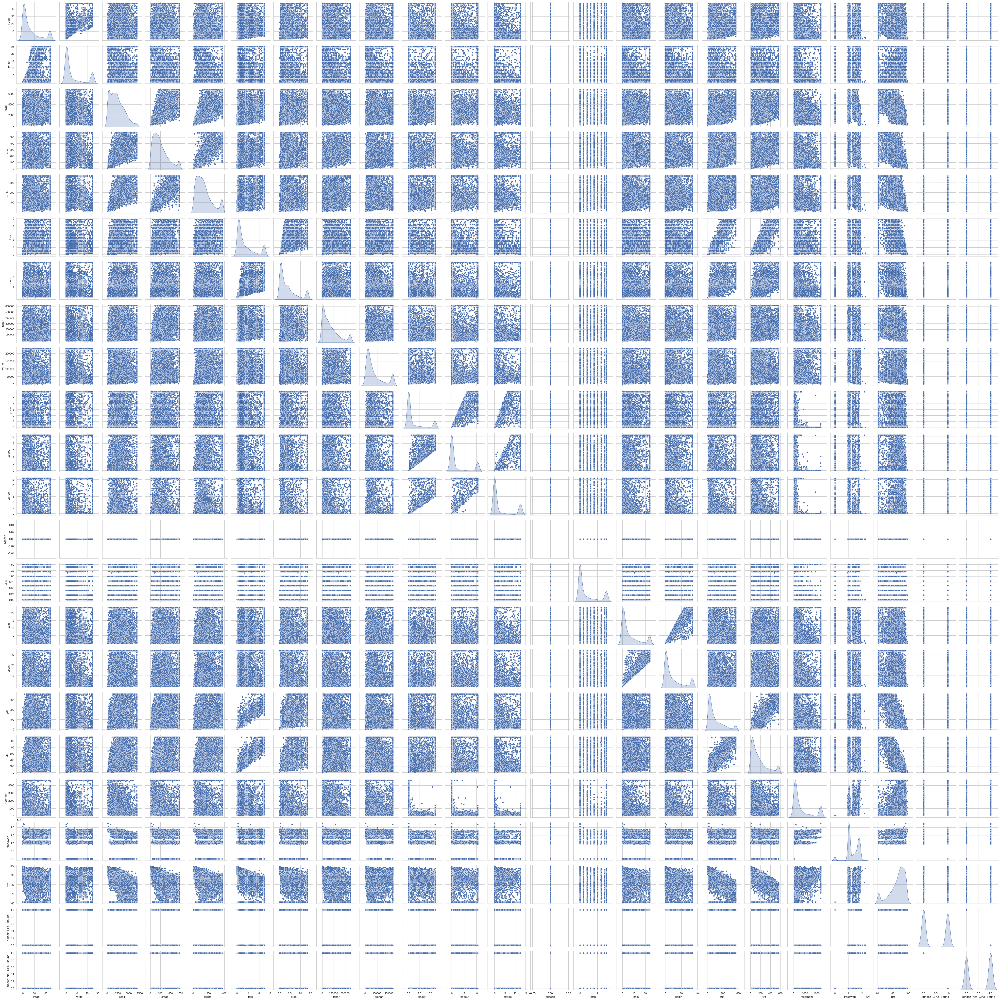

In [182]:
#df.describe gives information about univariate analysis
# Let us do a correlation analysis among the different dimensions and also each dimension with the dependent dimension
# This is done using scatter matrix function which creates a dashboard reflecting useful information about the dimensions
# The result can be stored as a .png file and opened in say, paint to get a larger view 

df_attr = df1.iloc[:, 0:23]

#axes = pd.plotting.scatter_matrix(mpg_df_attr)
#plt.tight_layout()
#plt.savefig('d:\greatlakes\mpg_pairpanel.png')

sns.pairplot(df_attr, diag_kind='kde')   # to plot density curve instead of histogram

#sns.pairplot(mpg_df_attr)  # to plot histogram, the default

In [ ]:
#The data distribution across various dimensions except do not look normal distributions except for runqsz cpu and not cpu based, we have mixed up data from different gausians

#Close observation indicate there is no stronger relationship between any of the attributes



In [184]:
# Copy all the predictor variables into X dataframe. Since 'mpg' is dependent variable drop it
X = df1.drop('usr', axis=1)

# Copy the 'mpg' column alone into the y dataframe. This is the dependent variable
y = df1[['usr']]

In [231]:
#Let us break the X and y dataframes into training set and test set. For this we will use
#Sklearn package's data splitting function which is based on random function

from sklearn.model_selection import train_test_split
# Import Linear Regression machine learning library
from sklearn.linear_model import LinearRegression

In [232]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [233]:
# invoke the LinearRegression function and find the bestfit model on training data

regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [188]:
#best fit surface for the coefficients of the attributes that were used
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for lread is -0.06348150618198102
The coefficient for lwrite is 0.048161287091400676
The coefficient for scall is -0.0006638280111680886
The coefficient for sread is 0.00030825210314774
The coefficient for swrite is -0.0054218222976327845
The coefficient for fork is 0.029312727248915583
The coefficient for exec is -0.3211664838982268
The coefficient for rchar is -5.166841759476132e-06
The coefficient for wchar is -5.402875235432446e-06
The coefficient for pgout is -0.36881906387311825
The coefficient for ppgout is -0.07659768212730365
The coefficient for pgfree is 0.08448414470553443
The coefficient for pgscan is -1.1102230246251565e-16
The coefficient for atch is 0.6275741574820666
The coefficient for pgin is 0.019987907678657355
The coefficient for ppgin is -0.0673338397569933
The coefficient for pflt is -0.03360282937752203
The coefficient for vflt is -0.005463668798519856
The coefficient for freemem is -0.00045846718794643413
The coefficient for freeswap is 8.831840

we can see that portion of time that cpu run user mode with process run queue size cpu bound shows negative relationship 
whereas with process run queue size with cpu not bound shows positive relationship

In [31]:
# Let us check the intercept for the model

intercept = regression_model.intercept_[0]

print("The intercept for our model is {}".format(intercept))

The intercept for our model is 84.92938971974272


Usr= -0.063read + 0.048l write -0.00066scall + 0.0003sread - 0.0054swrite + 0.0293fork - 0.3211exec - 5.16e-06rchar - 5.402e-06wchar - 0.368pgout - 0.0765ppgout + 0.084pgfree - 1.110e-16pgscan + 0.627atch + 0.019pgin - 0.067ppgin - 0.03pflt - 0.005vflt -0.0004freeman + 8.83e-06freeswap - 0.807runqsz cpu bound + 0.807runqsz cpu not bound + 84.9293

In [189]:
# R square on training data
regression_model.score(X_train, y_train)

0.796108610127457

In [190]:
# R square on testing data
regression_model.score(X_test, y_test)

0.7677318597936111

In first iteration 76.7% of the test cases model has correctly predicted usr 

In [33]:
# R square on training data
regression_model.score(X_train, y_train)

0.796108610127457

In [192]:
from sklearn import metrics

In [193]:
#RMSE on Training data
predicted_train=regression_model.fit(X_train, y_train).predict(X_train)
np.sqrt(metrics.mean_squared_error(y_train,predicted_train))

4.419536092979902

In [194]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

4.652295704192661

In [226]:
import statsmodels.api as sm

In [196]:
X_train=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.
X_test=sm.add_constant(X_test)

In [197]:
model = sm.OLS(y_train,X_train).fit()
model.params

const                   5.661959e+01
lread                  -6.348151e-02
lwrite                  4.816129e-02
scall                  -6.638280e-04
sread                   3.082521e-04
swrite                 -5.421822e-03
fork                    2.931273e-02
exec                   -3.211665e-01
rchar                  -5.166842e-06
wchar                  -5.402875e-06
pgout                  -3.688191e-01
ppgout                 -7.659768e-02
pgfree                  8.448414e-02
pgscan                 -1.510064e-14
atch                    6.275742e-01
pgin                    1.998791e-02
ppgin                  -6.733384e-02
pflt                   -3.360283e-02
vflt                   -5.463669e-03
freemem                -4.584672e-04
freeswap                8.831840e-06
runqsz_CPU_Bound        2.750215e+01
runqsz_Not_CPU_Bound    2.911745e+01
dtype: float64

In [198]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.796
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     1115.
Date:                Fri, 02 Dec 2022   Prob (F-statistic):               0.00
Time:                        12:13:48   Log-Likelihood:                -16657.
No. Observations:                5734   AIC:                         3.336e+04
Df Residuals:                    5713   BIC:                         3.350e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                   56.6196      0.200    283.306      0.000      56.228      57.011
lread                   -0.0635      0.009     -7.071      0.000      -0.081      -0.046
lwrite                   0.0482      0.013      3.671      0.000       0.022       0.074
scall                   -0.0007   6.28e-05    -10.566      0.000      -0.001      -0.001
sread                    0.0003      0.001      0.305      0.760      -0.002       0.002
swrite                  -0.0054      0.001     -3.777      0.000      -0.008      -0.003
fork                     0.0293      0.132      0.222      0.824      -0.229       0.288
exec                    -0.3212      0.052     -6.220      0.000      -0.422      -0.220
rchar                -5.167e-06   4.88e-07    -10.598      0.000   -6.12e-06   -4.21e-06
wchar                -5.403e-06   1.03e-06     -5.232      0.000   -7.43e-06   -3.38e-06
pgout                   -0.3688      0.090     -4.098      0.000      -0.545      -0.192
ppgout                  -0.0766      0.079     -0.973      0.330      -0.231       0.078
pgfree                   0.0845      0.048      1.769      0.077      -0.009       0.178
pgscan                -1.51e-14   8.16e-17   -185.103      0.000   -1.53e-14   -1.49e-14
atch                     0.6276      0.143      4.394      0.000       0.348       0.908
pgin                     0.0200      0.028      0.703      0.482      -0.036       0.076
ppgin                   -0.0673      0.020     -3.415      0.001      -0.106      -0.029
pflt                    -0.0336      0.002    -16.957      0.000      -0.037      -0.030
vflt                    -0.0055      0.001     -3.830      0.000      -0.008      -0.003
freemem                 -0.0005   5.07e-05     -9.038      0.000      -0.001      -0.000
freeswap              8.832e-06    1.9e-07     46.472      0.000    8.46e-06     9.2e-06
runqsz_CPU_Bound        27.5021      0.126    217.516      0.000      27.254      27.750
runqsz_Not_CPU_Bound    29.1174      0.109    266.662      0.000      28.903      29.332
==============================================================================
Omnibus:                     1103.645   Durbin-Watson:                   2.016
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2372.553
Skew:                          -1.119   Prob(JB):                         0.00
Kurtosis:                       5.219   Cond. No.                     2.12e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.53e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [206]:
#Calculate MSE on train
predicted_train=model.predict(X_train)
mse=metrics.mean_squared_error(y_train,predicted_train)

In [207]:
np.sqrt(mse) #RMSE on train 

4.419536092979902

In [208]:
# Prediction on Test data
y_pred = model.predict(X_test)

In [209]:
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

4.652295704193019

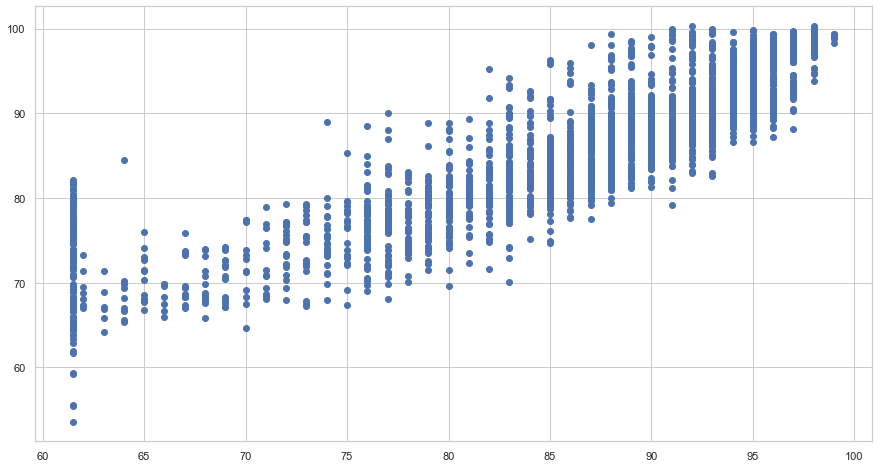

In [210]:
plt.scatter(y_test, y_pred)
plt.show()

In [212]:
for i,j in np.array(model.params.reset_index()):
    print('({}) * {} +'.format(round(j,2),i),end=' ')

(56.62) * const + (-0.06) * lread + (0.05) * lwrite + (-0.0) * scall + (0.0) * sread + (-0.01) * swrite + (0.03) * fork + (-0.32) * exec + (-0.0) * rchar + (-0.0) * wchar + (-0.37) * pgout + (-0.08) * ppgout + (0.08) * pgfree + (-0.0) * pgscan + (0.63) * atch + (0.02) * pgin + (-0.07) * ppgin + (-0.03) * pflt + (-0.01) * vflt + (-0.0) * freemem + (0.0) * freeswap + (27.5) * runqsz_CPU_Bound + (29.12) * runqsz_Not_CPU_Bound + 

In [213]:
# iteration 2 builds polynomial model where the individual column names rise to the power2 and independent column 
#interacts with each other
from sklearn.preprocessing import PolynomialFeatures
from sklearn import linear_model

poly = PolynomialFeatures(degree=2, interaction_only=True)
X_train_ = poly.fit_transform(X_train)

X_test_ = poly.fit_transform(X_test)

poly_clf = linear_model.LinearRegression()

poly_clf.fit(X_train_, y_train)

y_pred = poly_clf.predict(X_test_)

#print(y_pred)

print(poly_clf.score(X_test_, y_test))

0.8680398006376749


Where we can see that performance of the model has increased, where we can see the true interaction between the variables and usr column

In [214]:
model1 = sm.OLS(y_train,X_train_).fit()
model1

In [215]:
model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    usr   R-squared:                       0.893
Model:                            OLS   Adj. R-squared:                  0.888
Method:                 Least Squares   F-statistic:                     218.4
Date:                Fri, 02 Dec 2022   Prob (F-statistic):               0.00
Time:                        12:56:52   Log-Likelihood:                -14821.
No. Observations:                5734   AIC:                         3.006e+04
Df Residuals:                    5523   BIC:                         3.147e+04
Df Model:                         210                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         26.9022      0.193    139.213      0.000      26.523      27.281
x1            26.9045      0.193    139.212      0.000      26.526      27.283
x2            -0.0750      0.017     -4.381      0.000      -0.109      -0.041
x3             0.0365      0.024      1.489      0.137      -0.012       0.084
x4             0.0005      0.000      5.137      0.000       0.000       0.001
x5            -0.0012      0.002     -0.722      0.471      -0.004       0.002
x6            -0.0009      0.002     -0.385      0.701      -0.006       0.004
x7            -0.0250      0.220     -0.114      0.909      -0.456       0.406
x8             0.1231      0.082      1.499      0.134      -0.038       0.284
x9         -9.612e-06   8.07e-07    -11.909      0.000   -1.12e-05   -8.03e-06
x10        -5.191e-06   1.91e-06     -2.712      0.007   -8.94e-06   -1.44e-06
x11           -0.6695      0.195     -3.439      0.001      -1.051      -0.288
x12            0.6192      0.158      3.914      0.000       0.309       0.929
x13           -0.0623      0.075     -0.831      0.406      -0.209       0.085
x14          4.34e-06   3.67e-08    118.286      0.000    4.27e-06    4.41e-06
x15            0.3042      0.204      1.495      0.135      -0.095       0.703
x16            0.1031      0.043      2.373      0.018       0.018       0.188
x17           -0.0561      0.030     -1.853      0.064      -0.116       0.003
x18            0.0129      0.003      4.281      0.000       0.007       0.019
x19           -0.0065      0.002     -3.056      0.002      -0.011      -0.002
x20            0.0027      0.000     18.606      0.000       0.002       0.003
x21         4.048e-06   1.42e-07     28.582      0.000    3.77e-06    4.33e-06
x22            8.8016      0.175     50.384      0.000       8.459       9.144
x23           18.1006      0.181    100.009      0.000      17.746      18.455
x24           -0.0732      0.017     -4.275      0.000      -0.107      -0.040
x25            0.0365      0.024      1.492      0.136      -0.011       0.085
x26            0.0002      0.000      2.098      0.036    1.48e-05       0.000
x27           -0.0010      0.002     -0.620      0.535      -0.004       0.002
x28           -0.0010      0.002     -0.399      0.690      -0.006       0.004
x29           -0.0250      0.220     -0.114      0.909      -0.456       0.406
x30            0.1231      0.082      1.499      0.134      -0.038       0.284
x31        -2.021e-06   8.08e-07     -2.502      0.012    -3.6e-06   -4.37e-07
x32        -6.492e-06   1.91e-06     -3.391      0.001   -1.02e-05   -2.74e-06
x33           -0.6695      0.195     -3.439      0.001      -1.051      -0.288
x34            0.6192      0.158      3.914      0.000       0.309       0.929
x35           -0.0623      0.075     -0.831      0.406      -0.209       0.085
x3

In [221]:
#RMSE on Testing data
predicted_test=regression_model.fit(X_train, y_train).predict(X_test)
np.sqrt(metrics.mean_squared_error(y_test,predicted_test))

4.6522957041919435

In [217]:
np.sqrt(mse) #RMSE on train 

4.652295704193019

In [219]:
#Calculate MSE on test
mse=metrics.mean_squared_error(y_test,y_pred)
np.sqrt(mse) #RMSE on test

3.506662518325449

In [220]:
# X_train on the transformed dataset
print(X.shape)
print(X_train_.shape)
poly

(8192, 22)
(5734, 277)


PolynomialFeatures(interaction_only=True)

where 8192 and 22 original columns were supplied to polynomial function and had given 254 columns

problem 2

In [2]:
# reading the CSV file into pandas dataframe
df2 = pd.read_excel("D:\DATA SCIENCE {G L}\Predective modelling\Contraceptive_method_dataset.xlsx")  

In [94]:
df2.head().T

,0,1,2,3,4
Wife_age,24.0,45.0,43.0,42.0,36.0
Wife_ education,Primary,Uneducated,Primary,Secondary,Secondary
Husband_education,Secondary,Secondary,Secondary,Primary,Secondary
No_of_children_born,3.0,10.0,7.0,9.0,8.0
Wife_religion,Scientology,Scientology,Scientology,Scientology,Scientology
Wife_Working,No,No,No,No,No
Husband_Occupation,2,3,3,3,3
Standard_of_living_index,High,Very High,Very High,High,Low
Media_exposure,Exposed,Exposed,Exposed,Exposed,Exposed
Contraceptive_method_used,No,No,No,No,No


In [5]:
df2.shape

(1473, 10)

In [6]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1402 non-null   float64
 1   Wife_ education            1473 non-null   object 
 2   Husband_education          1473 non-null   object 
 3   No_of_children_born        1452 non-null   float64
 4   Wife_religion              1473 non-null   object 
 5   Wife_Working               1473 non-null   object 
 6   Husband_Occupation         1473 non-null   int64  
 7   Standard_of_living_index   1473 non-null   object 
 8   Media_exposure             1473 non-null   object 
 9   Contraceptive_method_used  1473 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 115.2+ KB


In [7]:
df2.describe()

,Wife_age,No_of_children_born,Husband_Occupation
count,1402.000000,1452.000000,1473.000000
mean,32.606277,3.254132,2.137814
std,8.274927,2.365212,0.864857
min,16.000000,0.000000,1.000000
25%,26.000000,1.000000,1.000000
50%,32.000000,3.000000,2.000000
75%,39.000000,4.000000,3.000000
max,49.000000,16.000000,4.000000


In [8]:
dups = df2.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df2.shape)

Number of duplicate rows = 80
(1473, 10)


In [9]:
df2.drop_duplicates(inplace=True)

In [10]:
dups = df2.duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(df2.shape)

Number of duplicate rows = 0
(1393, 10)


In [11]:
df2.isnull().sum()

Wife_age                     67
Wife_ education               0
Husband_education             0
No_of_children_born          21
Wife_religion                 0
Wife_Working                  0
Husband_Occupation            0
Standard_of_living_index      0
Media_exposure                0
Contraceptive_method_used     0
dtype: int64

There were 71 missing values in wife age column and 21 missing values in no of children born columns, 7 categorical columns are presnt, categorical variables are not in encoded form 

In [12]:
median1=df2["Wife_age"].median()

df2["Wife_age"].replace(np.nan,median1,inplace=True)

In [13]:
median1=df2["No_of_children_born"].median()

df2["No_of_children_born"].replace(np.nan,median1,inplace=True)

In [14]:
df2.isnull().sum()

Wife_age                     0
Wife_ education              0
Husband_education            0
No_of_children_born          0
Wife_religion                0
Wife_Working                 0
Husband_Occupation           0
Standard_of_living_index     0
Media_exposure               0
Contraceptive_method_used    0
dtype: int64

In [15]:
df2.median()

C:\Users\B R SIDDHARTH\AppData\Local\Temp\ipykernel_14872\1172267387.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df2.median()


Wife_age               32.0
No_of_children_born     3.0
Husband_Occupation      2.0
dtype: float64

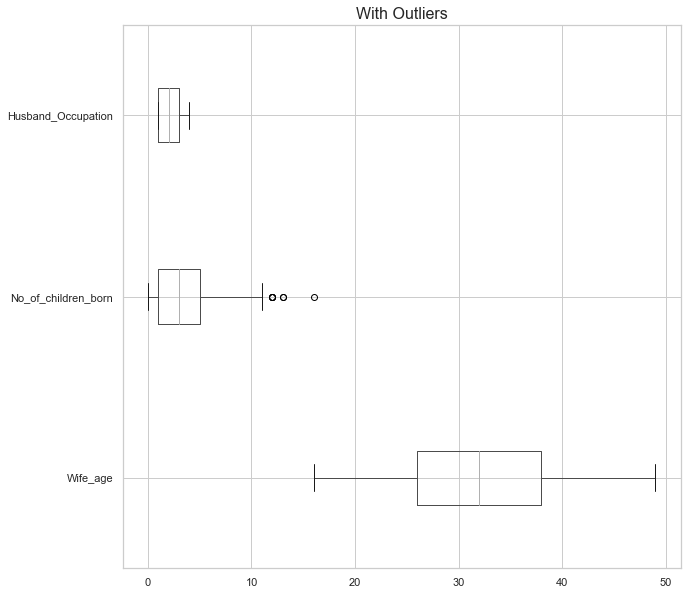

In [16]:
# outlier check

# construct box plot for continuous variables
cont=df2.dtypes[(df2.dtypes!='uint8') & (df2.dtypes!='bool')].index
plt.figure(figsize=(10,10))
df2[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [18]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [19]:
lrTotal_salary,urTotal_salary=remove_outlier(df2['No_of_children_born'])
df2['No_of_children_born']=np.where(df2['No_of_children_born']>urTotal_salary,urTotal_salary,df2['No_of_children_born'])
df2['No_of_children_born']=np.where(df2['No_of_children_born']<lrTotal_salary,lrTotal_salary,df2['No_of_children_born'])

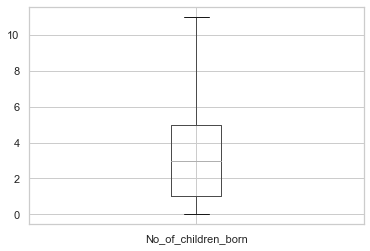

In [20]:
df2.boxplot(column=['No_of_children_born'])
plt.show()

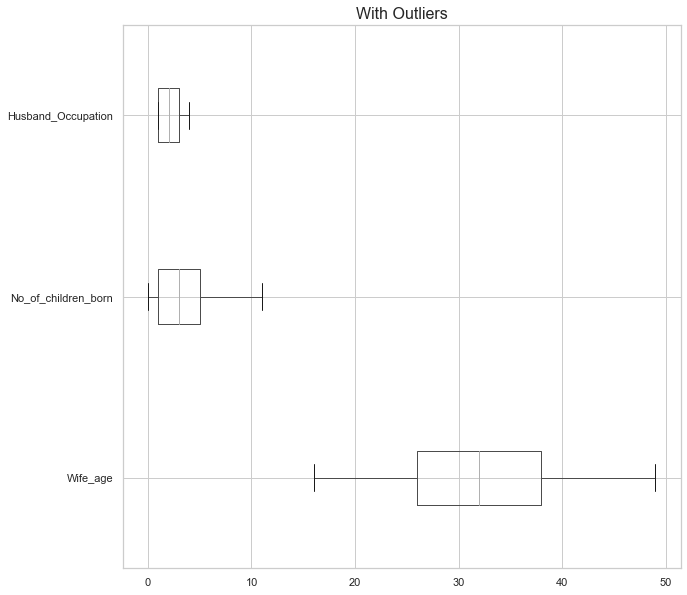

In [21]:
cont=df2.dtypes[(df2.dtypes!='uint8') & (df2.dtypes!='bool')].index
plt.figure(figsize=(10,10))
df2[cont].boxplot(vert=0)
plt.title('With Outliers',fontsize=16)
plt.show()

In [22]:
df2.describe()

,Wife_age,No_of_children_born,Husband_Occupation
count,1393.000000,1393.000000,1393.000000
mean,32.530510,3.277100,2.174444
std,8.088188,2.345673,0.854590
min,16.000000,0.000000,1.000000
25%,26.000000,1.000000,1.000000
50%,32.000000,3.000000,2.000000
75%,38.000000,5.000000,3.000000
max,49.000000,11.000000,4.000000


In [85]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1393 non-null   float64
 1   Wife_ education            1393 non-null   object 
 2   Husband_education          1393 non-null   object 
 3   No_of_children_born        1393 non-null   float64
 4   Wife_religion              1393 non-null   object 
 5   Wife_Working               1393 non-null   object 
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   object 
 8   Media_exposure             1393 non-null   object 
 9   Contraceptive_method_used  1393 non-null   object 
dtypes: float64(2), int64(1), object(7)
memory usage: 119.7+ KB


D:\softwares\jupyter\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\softwares\jupyter\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\softwares\jupyter\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\softwares\jupyter\lib\site-packages\seab

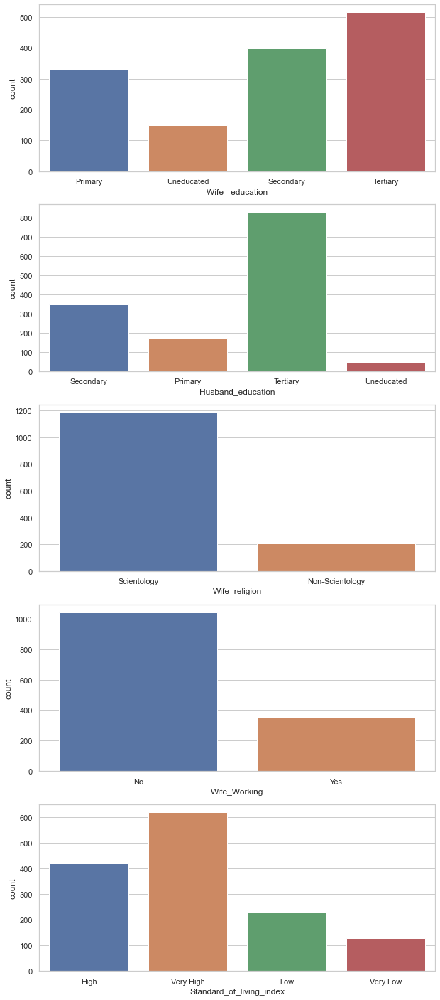

In [86]:
fig, axes = plt.subplots(nrows=5)
fig.set_size_inches(10,25)
sns.countplot(df2['Wife_ education'],ax=axes[0]);
sns.countplot(df2['Husband_education'],ax=axes[1]);
sns.countplot(df2['Wife_religion'],ax=axes[2]);
sns.countplot(df2['Wife_Working'],ax=axes[3]);
sns.countplot(df2['Standard_of_living_index'],ax=axes[4]);
plt.show()


D:\softwares\jupyter\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


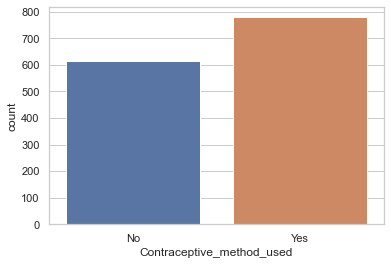

In [87]:
sns.countplot(df2['Contraceptive_method_used']);

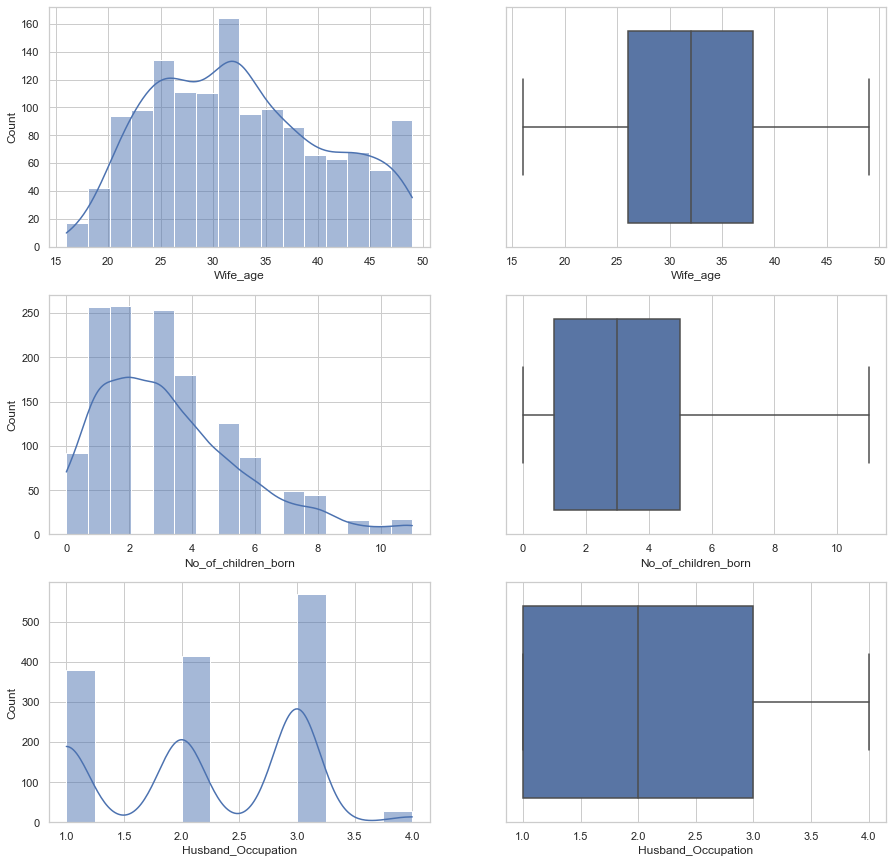

In [31]:
fig, axes = plt.subplots(nrows=3,ncols=2)
fig.set_size_inches(15,15)
sns.histplot(df2['Wife_age'], kde=True, ax=axes[0][0])
sns.boxplot(x='Wife_age', data=df2, ax=axes[0][1])
sns.histplot(df2['No_of_children_born'] , kde=True, ax=axes[1][0])
sns.boxplot(x='No_of_children_born', data=df2 , ax=axes[1][1])
sns.histplot(df2['Husband_Occupation'] , kde=True, ax=axes[2][0])
sns.boxplot(x='Husband_Occupation', data=df2 , ax=axes[2][1])
plt.show()

In [75]:
for column in df2.columns:
    if df2[column].dtype == 'object':
        print(column.upper(),': ',df2[column].nunique())
        print(df2[column].value_counts().sort_values())
        print('\n')

WIFE_ EDUCATION :  4
Uneducated    150
Primary       330
Secondary     398
Tertiary      515
Name: Wife_ education, dtype: int64


HUSBAND_EDUCATION :  4
Uneducated     44
Primary       175
Secondary     347
Tertiary      827
Name: Husband_education, dtype: int64


WIFE_RELIGION :  2
Non-Scientology     207
Scientology        1186
Name: Wife_religion, dtype: int64


WIFE_WORKING :  2
Yes     350
No     1043
Name: Wife_Working, dtype: int64


STANDARD_OF_LIVING_INDEX :  4
Very Low     129
Low          227
High         419
Very High    618
Name: Standard_of_living_index, dtype: int64


MEDIA_EXPOSURE  :  2
Not-Exposed     109
Exposed        1284
Name: Media_exposure , dtype: int64


CONTRACEPTIVE_METHOD_USED :  2
No     614
Yes    779
Name: Contraceptive_method_used, dtype: int64




In [251]:
from pylab import rcParams
rcParams['figure.figsize'] = 15,8

In class attribute we use no-class 1 and yes as class- 2

In [252]:
rcParams['figure.figsize'] = 15,8

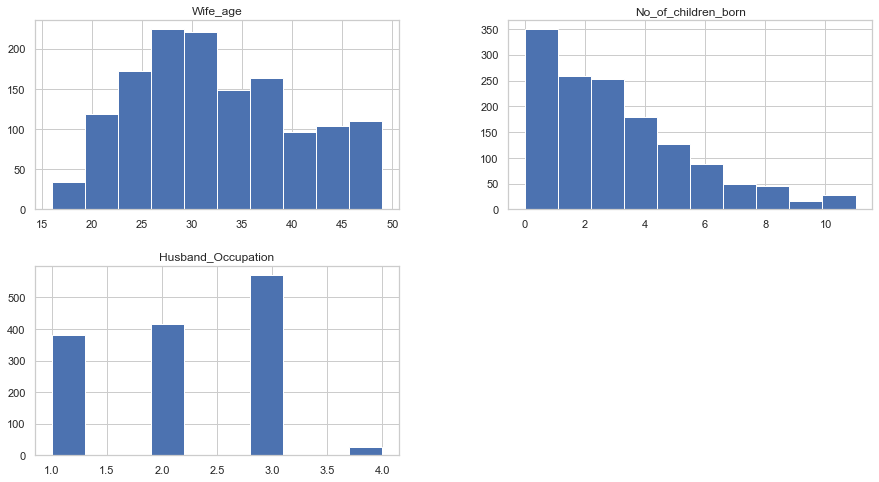

In [253]:
df2[['Wife_age','No_of_children_born','Husband_Occupation']].hist();

D:\softwares\jupyter\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


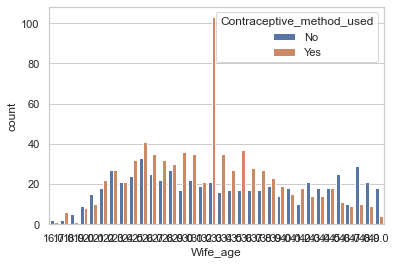

In [77]:
sns.countplot(df2['Wife_age'],hue=df2['Contraceptive_method_used']);

D:\softwares\jupyter\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


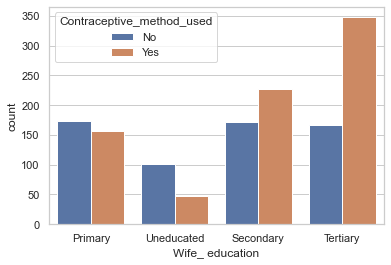

In [97]:
sns.countplot(df2['Wife_ education'],hue=df2['Contraceptive_method_used']);

In [ ]:
sns.countplot(df2['Wife_ education'],hue=df2['Contraceptive_method_used']);

D:\softwares\jupyter\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


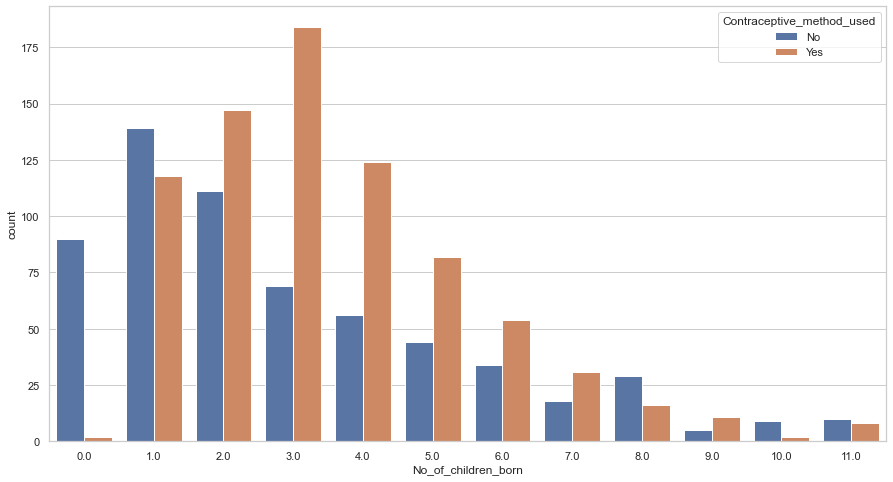

In [257]:
sns.countplot(df2['No_of_children_born'],hue=df2['Contraceptive_method_used']);

D:\softwares\jupyter\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


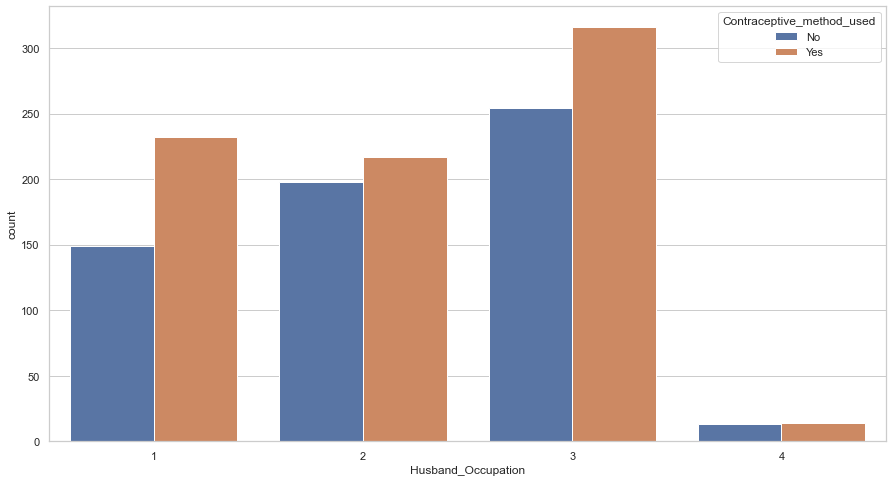

In [258]:
sns.countplot(df2['Husband_Occupation'],hue=df2['Contraceptive_method_used']);

In [256]:
df2.corr()

,Wife_age,No_of_children_born,Husband_Occupation
Wife_age,1.000000,0.530123,-0.187070
No_of_children_born,0.530123,1.000000,-0.021981
Husband_Occupation,-0.187070,-0.021981,1.000000


<AxesSubplot:>

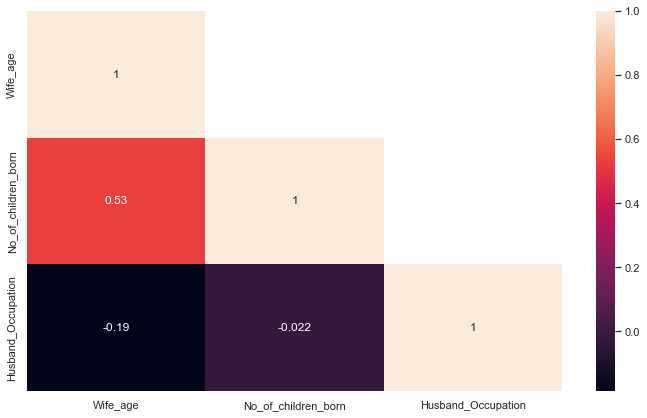

In [225]:
plt.figure(figsize=(12,7))
sns.heatmap(df2.corr(), annot=True,mask=np.triu(df2.corr(),+1))

There are hardly any correlation between numeric variables

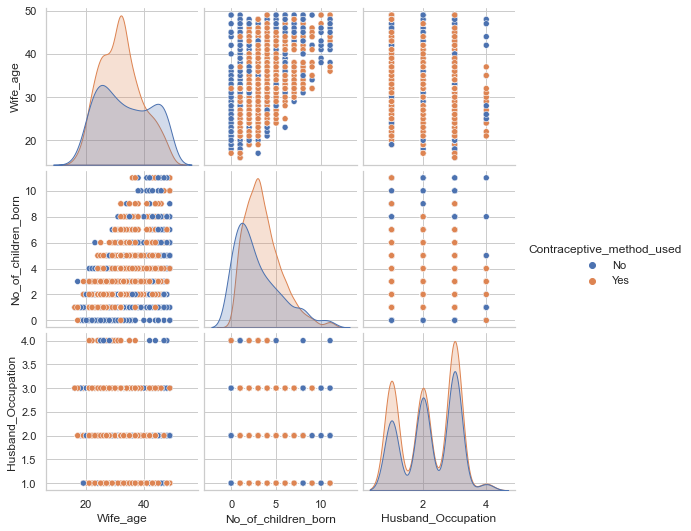

In [259]:
# Pairplot using sns
sns.pairplot(df2 ,diag_kind='kde' ,hue='Contraceptive_method_used');

As one distribution is within another distribution its difficult to say whether wife age, no of children born and husband occupation are good predicter of contraceptive method used

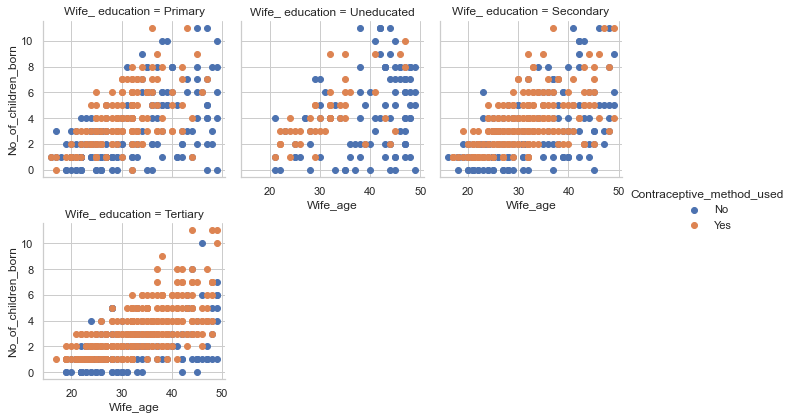

In [98]:
g = sns.FacetGrid(df2, col="Wife_ education", hue='Contraceptive_method_used',col_wrap=3, height=3)
g = g.map(plt.scatter, "Wife_age", 'No_of_children_born')
g.add_legend()

# converting all objects to categorical codes

In [99]:
df2['Wife_ education']=np.where(df2['Wife_ education'] =='Uneducated', '1', df2['Wife_ education'])
df2['Wife_ education']=np.where(df2['Wife_ education'] =='Primary', '2', df2['Wife_ education'])
df2['Wife_ education']=np.where(df2['Wife_ education'] =='Secondary', '3', df2['Wife_ education'])
df2['Wife_ education']=np.where(df2['Wife_ education'] =='Tertiary', '4', df2['Wife_ education'])


In [100]:
df2['Husband_education']=np.where(df2['Husband_education'] =='Uneducated', '1', df2['Husband_education'])
df2['Husband_education']=np.where(df2['Husband_education'] =='Primary', '2', df2['Husband_education'])
df2['Husband_education']=np.where(df2['Husband_education'] =='Secondary', '3', df2['Husband_education'])
df2['Husband_education']=np.where(df2['Husband_education'] =='Tertiary', '4', df2['Husband_education'])


In [101]:
df2['Standard_of_living_index']=np.where(df2['Standard_of_living_index'] =='Very Low', '1', df2['Standard_of_living_index'])
df2['Standard_of_living_index']=np.where(df2['Standard_of_living_index'] =='Low', '2', df2['Standard_of_living_index'])
df2['Standard_of_living_index']=np.where(df2['Standard_of_living_index'] =='High', '3', df2['Standard_of_living_index'])
df2['Standard_of_living_index']=np.where(df2['Standard_of_living_index'] =='Very High', '4', df2['Standard_of_living_index'])

In [113]:
df2.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,3,3.0,Scientology,No,2,3,Exposed,0
1,45.0,1,3,10.0,Scientology,No,3,4,Exposed,0
2,43.0,2,3,7.0,Scientology,No,3,4,Exposed,0
3,42.0,3,2,9.0,Scientology,No,3,3,Exposed,0
4,36.0,3,3,8.0,Scientology,No,3,2,Exposed,0


In [114]:
## Converting the education variable to numeric

df2['Husband_education'] = df2['Husband_education'].astype('int64')
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1393 non-null   float64
 1   Wife_ education            1393 non-null   object 
 2   Husband_education          1393 non-null   int64  
 3   No_of_children_born        1393 non-null   float64
 4   Wife_religion              1393 non-null   object 
 5   Wife_Working               1393 non-null   object 
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   object 
 8   Media_exposure             1393 non-null   object 
 9   Contraceptive_method_used  1393 non-null   object 
dtypes: float64(2), int64(2), object(6)
memory usage: 119.7+ KB


In [194]:
## Converting the 'salary' Variable into numeric by using the LabelEncoder functionality inside sklearn.
from sklearn.preprocessing import LabelEncoder

## Defining a Label Encoder object instance
LE = LabelEncoder()

In [195]:
## Applying the created Label Encoder object for the target class
## Assigning the 0 to <=50k and 1 to >50
df2['Contraceptive_method_used'] = LE.fit_transform(df2['Contraceptive_method_used'])
df2.head()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
0,24.0,2,3,3.0,Scientology,No,2,3,Exposed,0
1,45.0,1,3,10.0,Scientology,No,3,4,Exposed,0
2,43.0,2,3,7.0,Scientology,No,3,4,Exposed,0
3,42.0,3,2,9.0,Scientology,No,3,3,Exposed,0
4,36.0,3,3,8.0,Scientology,No,3,2,Exposed,0


In [196]:
df2.tail()

,Wife_age,Wife_ education,Husband_education,No_of_children_born,Wife_religion,Wife_Working,Husband_Occupation,Standard_of_living_index,Media_exposure,Contraceptive_method_used
1468,33.0,4,4,3.0,Scientology,Yes,2,4,Exposed,1
1469,33.0,4,4,3.0,Scientology,No,1,4,Exposed,1
1470,39.0,3,3,3.0,Scientology,Yes,1,4,Exposed,1
1471,33.0,3,3,3.0,Scientology,Yes,2,2,Exposed,1
1472,17.0,3,3,1.0,Scientology,No,2,4,Exposed,1


class 0 - contraceptive not used(No)
class 1 - contraceptive used(yes)

In [197]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1393 entries, 0 to 1472
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1393 non-null   float64
 1   Wife_ education            1393 non-null   object 
 2   Husband_education          1393 non-null   int64  
 3   No_of_children_born        1393 non-null   float64
 4   Wife_religion              1393 non-null   object 
 5   Wife_Working               1393 non-null   object 
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   object 
 8   Media_exposure             1393 non-null   object 
 9   Contraceptive_method_used  1393 non-null   int64  
dtypes: float64(2), int64(3), object(5)
memory usage: 119.7+ KB


In [198]:
## Converting the other 'object' type variables as dummy variables

adult_data_dummy = pd.get_dummies(df2,drop_first=True)
adult_data_dummy.head()

,Wife_age,Husband_education,No_of_children_born,Husband_Occupation,Contraceptive_method_used,Wife_ education_2,Wife_ education_3,Wife_ education_4,Wife_religion_Scientology,Wife_Working_Yes,Standard_of_living_index_2,Standard_of_living_index_3,Standard_of_living_index_4,Media_exposure _Not-Exposed
0,24.0,3,3.0,2,0,1,0,0,1,0,0,1,0,0
1,45.0,3,10.0,3,0,0,0,0,1,0,0,0,1,0
2,43.0,3,7.0,3,0,1,0,0,1,0,0,0,1,0
3,42.0,2,9.0,3,0,0,1,0,1,0,0,1,0,0
4,36.0,3,8.0,3,0,0,1,0,1,0,1,0,0,0


Train test split

In [199]:
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import roc_auc_score,roc_curve,classification_report,confusion_matrix,plot_confusion_matrix

In [200]:
#step 1
# Copy all the predictor variables into X dataframe
X = adult_data_dummy.drop('Contraceptive_method_used', axis=1)

# Copy target into the y dataframe. 
y = adult_data_dummy['Contraceptive_method_used']

In [201]:
#step 2
# Split X and y into training and test set in 70:30 ratio 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30 , random_state=1,stratify=adult_data_dummy['Contraceptive_method_used'])

# 70 percent train data and 30 test data

In [202]:
y_train.value_counts(1)

1    0.558974
0    0.441026
Name: Contraceptive_method_used, dtype: float64

In [203]:
y_test.value_counts(1)

1    0.559809
0    0.440191
Name: Contraceptive_method_used, dtype: float64

# logistic regression

In [204]:
#step 3 intializing model
# Fit the Logistic Regression model
model = LogisticRegression(solver='newton-cg',max_iter=10000,penalty='none',verbose=True,n_jobs=2)
model.fit(X_train, y_train)

[Parallel(n_jobs=2)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   1 out of   1 | elapsed:   19.8s finished


LogisticRegression(max_iter=10000, n_jobs=2, penalty='none', solver='newton-cg',
                   verbose=True)

Predicting on Training and Test dataset

In [205]:
ytrain_predict = model.predict(X_train)
ytest_predict = model.predict(X_test)

Getting the Predicted Classes and Probs

In [206]:
# probabilties that data points will be in class  1 and 0
ytest_predict_prob=model.predict_proba(X_test)
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.272247,0.727753
1,0.649134,0.350866
2,0.357667,0.642333
3,0.285567,0.714433
4,0.233296,0.766704


Model Evaluation

In [207]:
# Accuracy - Training Data
model.score(X_train, y_train)

0.6717948717948717

AUC: 0.722


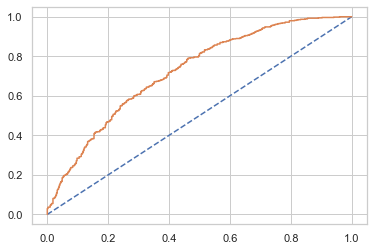

In [222]:
# predict probabilities
probs = model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
auc = roc_auc_score(y_train, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
train_fpr, train_tpr, train_thresholds = roc_curve(y_train, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(train_fpr, train_tpr);

In [211]:
# Accuracy - Test Data
model.score(X_test, y_test)

0.6339712918660287

AUC and ROC for the test data

AUC: 0.663


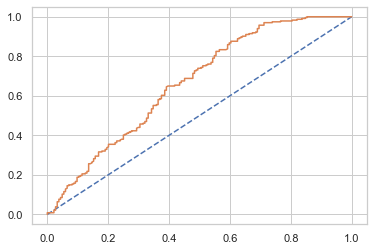

In [221]:
# predict probabilities
probs = model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
test_auc = roc_auc_score(y_test, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
test_fpr, test_tpr, test_thresholds = roc_curve(y_test, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(test_fpr, test_tpr);

Confusion Matrix for the training data

In [133]:
confusion_matrix(y_train, ytrain_predict)

array([[233, 197],
       [123, 422]], dtype=int64)

D:\softwares\jupyter\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


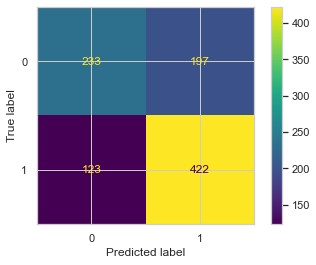

In [134]:
plot_confusion_matrix(model,X_train,y_train);

In [135]:
print(classification_report(y_train, ytrain_predict))

              precision    recall  f1-score   support

           0       0.65      0.54      0.59       430
           1       0.68      0.77      0.73       545

    accuracy                           0.67       975
   macro avg       0.67      0.66      0.66       975
weighted avg       0.67      0.67      0.67       975



Confusion Matrix for test data

In [136]:
confusion_matrix(y_test, ytest_predict)

array([[ 84, 100],
       [ 53, 181]], dtype=int64)

D:\softwares\jupyter\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


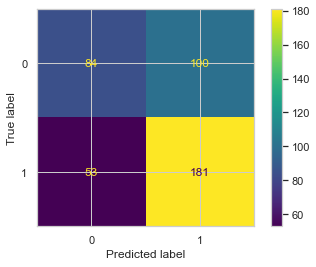

In [137]:
plot_confusion_matrix(model,X_test,y_test);

In [138]:
print(classification_report(y_test, ytest_predict))

              precision    recall  f1-score   support

           0       0.61      0.46      0.52       184
           1       0.64      0.77      0.70       234

    accuracy                           0.63       418
   macro avg       0.63      0.62      0.61       418
weighted avg       0.63      0.63      0.62       418



Inferences:

For predicting contraceptive method for the women who have not used it- No class( label 0)

Precision (64%) - 64% of the women have actually not used contraceptive method  out of all women predicted of not using the contaceptive method.

Recall (78%) – Out of all the women who had actually not used contraceptive method , 78% of women have been predicted correctly.

For predicting contraceptive method for the women who have used it- yes class( label 1)

Precision (62%) - 62% of the women have actually used contraceptive method out of all women predicted of using the contaceptive method.

Recall (45%) – Out of all the women who had actually used contraceptive method , 78% of women have been predicted correctly.



# LDA Model

In [243]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import metrics,model_selection
from sklearn.preprocessing import scale

In [244]:
# Copy all the predictor variables into X dataframe
X = adult_data_dummy.drop('Contraceptive_method_used', axis=1)

# Copy target into the y dataframe. 
y = adult_data_dummy['Contraceptive_method_used']

In [245]:
#Build LDA Model
# Refer details for LDA at http://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html
clf = LinearDiscriminantAnalysis()
model=clf.fit(X,y)
model

LinearDiscriminantAnalysis()

In [246]:
# Predict it
pred_class = model.predict(X)
df2['Prediction'] = pred_class 

In [248]:
# Check Correlation values
#Refer on correlation at https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.corr.html
data= df2[['Wife_age','Wife_ education','Husband_education','No_of_children_born','Wife_religion','Wife_Working','Standard_of_living_index','Prediction']]
Cor1 = data.corr()
Cor1

,Wife_age,Husband_education,No_of_children_born,Prediction
Wife_age,1.000000,-0.062177,0.530123,-0.217357
Husband_education,-0.062177,1.000000,-0.189581,0.339500
No_of_children_born,0.530123,-0.189581,1.000000,0.207836
Prediction,-0.217357,0.339500,0.207836,1.000000


In [240]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1393 entries, 0 to 1472
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Wife_age                   1393 non-null   float64
 1   Wife_ education            1393 non-null   object 
 2   Husband_education          1393 non-null   int64  
 3   No_of_children_born        1393 non-null   float64
 4   Wife_religion              1393 non-null   object 
 5   Wife_Working               1393 non-null   object 
 6   Husband_Occupation         1393 non-null   int64  
 7   Standard_of_living_index   1393 non-null   object 
 8   Media_exposure             1393 non-null   object 
 9   Contraceptive_method_used  1393 non-null   int64  
 10  Prediction                 1393 non-null   int64  
dtypes: float64(2), int64(4), object(5)
memory usage: 130.6+ KB


In [141]:
X_train,X_test,y_train,y_test = model_selection.train_test_split(X,y,test_size=0.30,random_state=1,stratify = y)

In [142]:
#Build LDA Model
clf = LinearDiscriminantAnalysis()
model=clf.fit(X_train,y_train)

In [145]:
#intercept value
clf.intercept_ 

array([0.32426624])

In [223]:
#coefficients for the Linear Discriminant Function
clf.coef_

array([[-0.07698423,  0.04281819,  0.32696933,  0.14608406,  0.29755079,
         0.75479297,  1.45303196, -0.43945715, -0.17088542,  0.1702963 ,
         0.52468213,  0.86129791, -0.43280056]])

In [224]:
X_train.columns

Index(['Wife_age', 'Husband_education', 'No_of_children_born',
       'Husband_Occupation', 'Wife_ education_2', 'Wife_ education_3',
       'Wife_ education_4', 'Wife_religion_Scientology', 'Wife_Working_Yes',
       'Standard_of_living_index_2', 'Standard_of_living_index_3',
       'Standard_of_living_index_4', 'Media_exposure _Not-Exposed'],
      dtype='object')

In [214]:
a=clf.coef_
np.round(a,2) # rounded up coefficients 

array([[-0.08,  0.04,  0.33,  0.15,  0.3 ,  0.75,  1.45, -0.44, -0.17,
         0.17,  0.52,  0.86, -0.43]])

\nLDF=0.324 + X1*(-0.08) + X2*(-0.04) + X3*(0.33) + X4*(0.15) + X5*(0.3) + X6*(0.75) + X7*(1.45) + X8*(-0.44) + X9*(-0.17) + X10*(0.17) + X611*(0.52) + X12*(0.86) + X13*(-0.43)

In [215]:
# Training Data Class Prediction with a cut-off value of 0.5
pred_class_train = model.predict(X_train)

# Test Data Class Prediction with a cut-off value of 0.5
pred_class_test = model.predict(X_test)

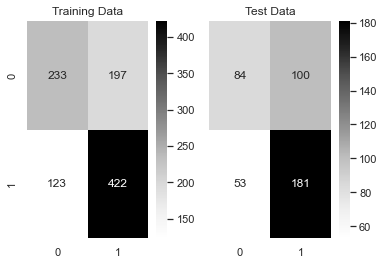

In [216]:
f,a =  plt.subplots(1,2,sharex=True,sharey=True,squeeze=False)

#Plotting confusion matrix for the different models for the Training Data

plot_0 = sns.heatmap((metrics.confusion_matrix(y_train,pred_class_train)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][0]);
a[0][0].set_title('Training Data')

plot_1 = sns.heatmap((metrics.confusion_matrix(y_test,pred_class_test)),annot=True,fmt='.5g',cmap='Greys',ax=a[0][1]);
a[0][1].set_title('Test Data');

In [218]:
print('Classification Report of the training data:\n\n',metrics.classification_report(y_train,pred_class_train),'\n')
print('Classification Report of the test data:\n\n',metrics.classification_report(y_test,pred_class_test),'\n')

Classification Report of the training data:

               precision    recall  f1-score   support

           0       0.65      0.54      0.59       430
           1       0.68      0.77      0.73       545

    accuracy                           0.67       975
   macro avg       0.67      0.66      0.66       975
weighted avg       0.67      0.67      0.67       975
 

Classification Report of the test data:

               precision    recall  f1-score   support

           0       0.61      0.46      0.52       184
           1       0.64      0.77      0.70       234

    accuracy                           0.63       418
   macro avg       0.63      0.62      0.61       418
weighted avg       0.63      0.63      0.62       418
 



In [225]:
# Training Data Probability Prediction
pred_prob_train = model.predict_proba(X_train)

# Test Data Probability Prediction
pred_prob_test = model.predict_proba(X_test)

AUC for the Training Data: 0.722
AUC for the Test Data: 0.663


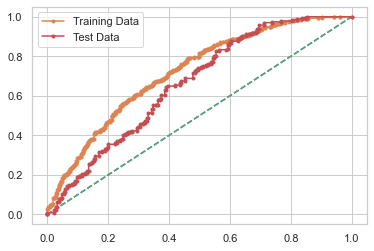

In [220]:
# AUC and ROC for the training data

# calculate AUC
auc = metrics.roc_auc_score(y_train,pred_prob_train[:,1])
print('AUC for the Training Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_train,pred_prob_train[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label = 'Training Data')


# AUC and ROC for the test data

# calculate AUC
auc = metrics.roc_auc_score(y_test,pred_prob_test[:,1])
print('AUC for the Test Data: %.3f' % auc)

#  calculate roc curve
fpr, tpr, thresholds = metrics.roc_curve(y_test,pred_prob_test[:,1])
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.',label='Test Data')
# show the plot
plt.legend(loc='best')
plt.show()

# CART Model

In [176]:
from sklearn.model_selection import train_test_split
X_train, X_test, train_labels, test_labels = train_test_split(X, y, test_size=.30, random_state=1)

In [178]:
print('X_train',X_train.shape)
print('X_test',X_test.shape)
print('train_labels',train_labels.shape)
print('test_labels',test_labels.shape)
print('Total Obs',8083+3465)

X_train (975, 13)
X_test (418, 13)
train_labels (975,)
test_labels (418,)
Total Obs 11548


Building a Decision Tree Classifier¶

In [166]:
from sklearn.tree import DecisionTreeClassifier

In [167]:
# Initialise a Decision Tree Classifier
dt_model = DecisionTreeClassifier(criterion = 'gini', random_state=1)

In [168]:
# Fit the model
dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(random_state=1)

In [175]:
from sklearn import tree

train_char_label = ['No', 'Yes']
ld_Tree_File = open('ld_Tree_File.dot','w')
dot_data = tree.export_graphviz(dt_model, 
                                out_file=ld_Tree_File, 
                                feature_names = list(X_train), 
                                class_names = list(train_char_label))

ld_Tree_File.close()

In [171]:
print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values('Imp',ascending=False))

                                  Imp
Wife_age                     0.299004
No_of_children_born          0.223921
Husband_Occupation           0.096891
Husband_education            0.062397
Wife_Working_Yes             0.062081
Standard_of_living_index_4   0.048258
Wife_ education_2            0.040914
Standard_of_living_index_3   0.040056
Wife_ education_4            0.032993
Wife_religion_Scientology    0.026436
Wife_ education_3            0.024620
Media_exposure _Not-Exposed  0.021922
Standard_of_living_index_2   0.020505


Predicting Test Data

In [179]:
y_predict = dt_model.predict(X_test)

In [180]:
y_predict.shape

(418,)

In [187]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 30,min_samples_leaf=200,min_samples_split=1000,random_state=1)
reg_dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(max_depth=30, min_samples_leaf=200,
                       min_samples_split=1000, random_state=1)

In [188]:
ld_tree_regularized = open('ld_tree_regularized.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= ld_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

ld_tree_regularized.close()
dot_data

In [234]:
print (pd.DataFrame(reg_dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values('Imp',ascending=False))

                             Imp
Wife_age                     0.0
Husband_education            0.0
No_of_children_born          0.0
Husband_Occupation           0.0
Wife_ education_2            0.0
Wife_ education_3            0.0
Wife_ education_4            0.0
Wife_religion_Scientology    0.0
Wife_Working_Yes             0.0
Standard_of_living_index_2   0.0
Standard_of_living_index_3   0.0
Standard_of_living_index_4   0.0
Media_exposure _Not-Exposed  0.0


In [235]:
pd.DataFrame(ytest_predict_prob).head()

,0,1
0,0.272247,0.727753
1,0.649134,0.350866
2,0.357667,0.642333
3,0.285567,0.714433
4,0.233296,0.766704


In [236]:
print(classification_report(test_labels, ytest_predict))

              precision    recall  f1-score   support

           0       0.50      0.36      0.42       192
           1       0.56      0.70      0.62       226

    accuracy                           0.54       418
   macro avg       0.53      0.53      0.52       418
weighted avg       0.54      0.54      0.53       418

